In [1]:
import pandas as pd
%matplotlib inline

import numpy as np
import h5py
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
h = 0.6776942783267969
pd.set_option("display.max_rows", None, "display.max_columns", None)

from tangos_halo_module.halo_properties import velocity_angles, track_halo_property, get_timesteps, ID_to_sim_halo_snap, infall_final_n_particles, infall_final_coordinates, apocentric_distance, disruption_time, accretion_time, orbit_interpolation, infall_velocity, quenching_time, max_sSFR_time, max_mass_time 
from tangos_halo_module.path import get_file_path, get_halo_snap_num, read_file
from tangos_halo_module.halos import ID_to_tangos_halo, get_survivors, get_main_progenitor_branch, get_zombies, get_host, get_survivor_IDs, get_zombie_IDs, blockPrint, enablePrint, tangos_to_pynbody_halo

In [2]:
data = pd.read_csv('Mint_Data/Data100.csv')
status = data['Status'].to_numpy()
ids = data['ID'].to_numpy()
t_disrupt = data['time_disruption'].to_numpy()
t_infall = data['time_infall'].to_numpy()

infall_vrad = abs(data['infall_radial_velocity'].to_numpy()/data['infall_relative_velocity'].to_numpy())
max_Mstar = data['max_stellarmass'].to_numpy()
log_max_Mstar = np.log10(max_Mstar)

t_quench = data['time_quench'].to_numpy()
# t_infall = np.array([accretion_time(ID=idx)[0] for idx in ids]) 
 
lookback_t_quench = 13.80-t_quench
lookback_t_disrupt = 13.80-t_disrupt
lookback_t_infall = 13.80-t_infall

phi_infall = data['infall_phi_z'].to_numpy()
phi_infall_deg = 180*phi_infall/np.pi
phi_infall_deg[phi_infall_deg>90]= 180-phi_infall_deg[phi_infall_deg>90]

phi_final = data['final_phi_z'].to_numpy()
phi_final_deg = 180*phi_final/np.pi
phi_final_deg[phi_final_deg>90]=180-phi_final_deg[phi_final_deg>90]

Delta_phi = phi_final_deg - phi_infall_deg

Mstar_infall = data['infall_mass'].to_numpy()
log_Mstar_infall = np.log10(Mstar_infall)

t_final = data['time_disruption'].to_numpy()
t_final[t_final==-1]=13.80 # For survivors
lookback_t_final = 13.80-t_final
Delta_t = t_final - t_infall

# Quenching Time vs Infall Time
Surviving (Triangles); Disrupted (Circles); Star-Forming (Navy outline); Quenched (Brown outline)

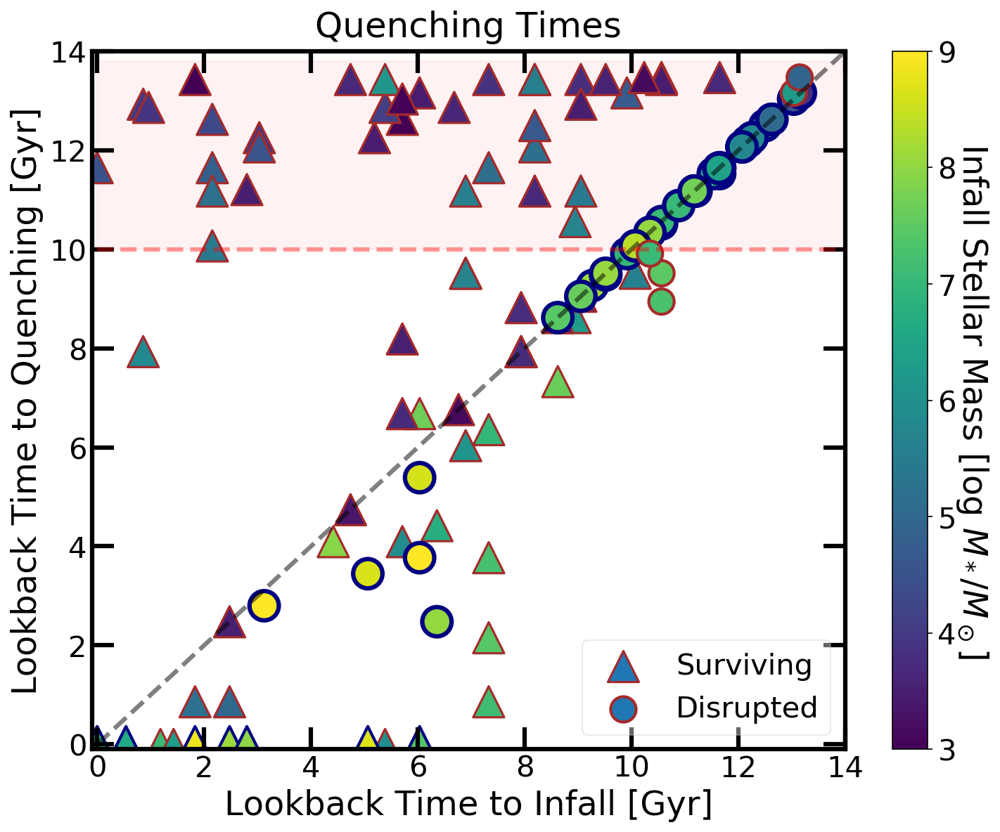

In [3]:
fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(10, 8))
# (ax1, ax2) = ax
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
# plt.setp(ax2.spines.values(), linewidth=3)

x=lookback_t_infall
y=lookback_t_quench
k=lookback_t_final
z=log_Mstar_infall
ax1.plot(linx, linx, lw=3, alpha=0.5, c='black', ls='--')
ax1.plot(linx, [10]*len(linx), lw=3, alpha=0.4, c='red', ls='--')
ax1.fill_between(linx, [10]*len(linx), [13.8]*len(linx), color='red', alpha=0.05)
# ax1.fill_between(linx, linx-1.5, linx+1.5, color='red', alpha=0.2)

# Survivors
im1 = ax1.scatter(x[status=='Survivor'], y[status=='Survivor'], marker='^', edgecolor='brown', 
                  c=z[status=='Survivor'], lw=1.5, s=450, cmap=cm, vmin=3, vmax=9, 
                  label='Surviving')
im1 = ax1.scatter(x[(status=='Survivor') & (y>13.8)], k[(status=='Survivor') & (y>13.8)], marker='^', 
                  edgecolor='navy', c=z[(status=='Survivor') & (y>13.8)], lw=2, s=600, cmap=cm, vmin=3, vmax=9)
# Zombies
ax1.scatter(x[(status=='Zombie') & (y>13.8)], k[(status=='Zombie') & (y>13.8)], marker='o', 
            edgecolor='navy', c=z[(status=='Zombie') & (y>13.8)], lw=3, s=400, cmap=cm, vmin=3, vmax=9) 
ax1.scatter(x[(status=='Zombie') & (y<13.8)], y[(status=='Zombie') & (y<13.8)], marker='o', 
            edgecolor='brown', c=z[(status=='Zombie') & (y<13.8)], lw=2, s=300, cmap=cm, vmin=3, vmax=9, 
            label='Disrupted')

cbar1 = fig.colorbar(im1, ax=ax1)
cbar1.set_label('Infall Stellar Mass [log $M_*/M_\odot$]', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)
ax1.set_xlim(-0.1, 14)
ax1.set_ylim(-0.1, 14)
ax1.legend(loc='lower right', fontsize=20, frameon=True, framealpha=0.4)
ax1.tick_params(which='major', length=15, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Quenching Times', fontsize=24, pad=10)
ax1.set_xlabel('Lookback Time to Infall [Gyr]', fontsize=23)
ax1.set_ylabel('Lookback Time to Quenching [Gyr]', fontsize=23)

fig.tight_layout()

# Cumulative Infall Mass Histograms

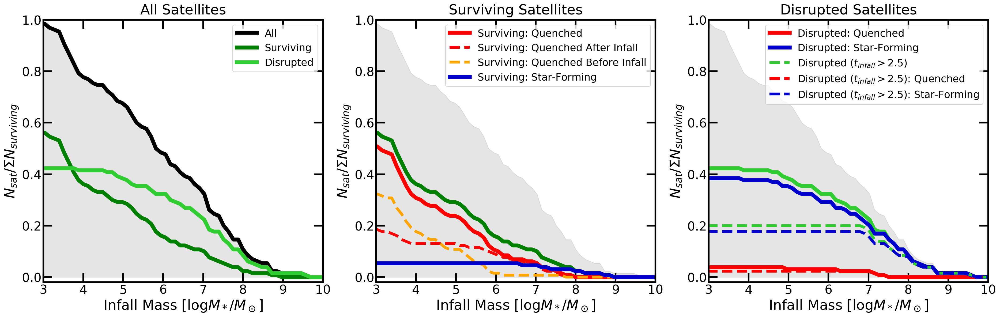

In [4]:
status = data['Status'].to_numpy()
simulation = data['Simulation'].to_numpy()
M_infall = np.log10(data['infall_mass'].to_numpy())
t_quench = data['time_quench'].to_numpy()
t_infall = data['time_infall'].to_numpy()

norm = len(status)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(25, 8))
fig.set_facecolor('w')
np.seterr(divide='ignore')
fig.set_dpi(150)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
plt.setp(ax3.spines.values(), linewidth=3)
linx=np.linspace(0, 12, 100)
# Survivors


A, B = np.histogram(M_infall, linx)
ax1.fill_between(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='black', alpha=0.1)
ax1.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='black', lw=7, label='All')
A, B = np.histogram(M_infall[status=='Survivor'], linx)
ax1.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='green',  lw=7, label='Surviving')
A, B = np.histogram(M_infall[status=='Zombie'], linx)
ax1.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='limegreen',  lw=7, label='Disrupted')
ax1.set_xlim(3, 10)
ax1.set_ylim(-0.02, 1)
ax1.legend(loc='upper right', fontsize=18, frameon=True)
ax1.tick_params(which='major', length=16, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=22, bottom=True, top=True, left=True, right=True)
ax1.set_title('All Satellites', fontsize=25, pad=10)
ax1.set_xlabel('Infall Mass [$\log M_*/M_\odot$]', fontsize=25)
ax1.set_ylabel('$N_{sat}/\Sigma N_{surviving}$', fontsize=25)


A, B = np.histogram(M_infall, linx)
ax2.fill_between(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='black', alpha=0.1)
A, B = np.histogram(M_infall[status=='Survivor'], linx)
ax2.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='green',  lw=7)
A, B = np.histogram(M_infall[(status=='Survivor') & (t_quench>0)], linx)
ax2.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='red',  lw=7, label='Surviving: Quenched')

A, B = np.histogram(M_infall[(status=='Survivor') & (t_quench>=t_infall)], linx)
ax2.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='red',  ls='--', lw=5, label='Surviving: Quenched After Infall')
A, B = np.histogram(M_infall[(status=='Survivor') & (t_quench>0) & (t_quench<t_infall)], linx)
ax2.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='orange',  ls='--', lw=5, label='Surviving: Quenched Before Infall')

A, B = np.histogram(M_infall[(status=='Survivor') & (t_quench<=0)], linx)
ax2.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='mediumblue',  lw=7, label='Surviving: Star-Forming')
ax2.set_xlim(3, 10)
ax2.set_ylim(-0.02, 1)
ax2.legend(loc='upper right', fontsize=18, frameon=True)
ax2.tick_params(which='major', length=16, width=3, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=22, bottom=True, top=True, left=True, right=True)
ax2.set_title('Surviving Satellites', fontsize=25, pad=10)
ax2.set_xlabel('Infall Mass [$\log M_*/M_\odot$]', fontsize=25)
ax2.set_ylabel('$N_{sat}/\Sigma N_{surviving}$', fontsize=25)

A, B = np.histogram(M_infall, linx)
ax3.fill_between(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='black', alpha=0.1)
A, B = np.histogram(M_infall[status=='Zombie'], linx)
ax3.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='limegreen',  lw=7)
A, B = np.histogram(M_infall[(status=='Zombie') & (t_quench>0)], linx)
ax3.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='red',  lw=7, label='Disrupted: Quenched')
A, B = np.histogram(M_infall[(status=='Zombie') & (t_quench<=0)], linx)
ax3.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='mediumblue',  lw=7, label='Disrupted: Star-Forming')
A, B = np.histogram(M_infall[(status=='Zombie') & (t_infall>=2.5)], linx)
ax3.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='limegreen',  lw=5, ls='--', label='Disrupted ($t_{infall} > 2.5$)')
A, B = np.histogram(M_infall[(status=='Zombie') & (t_quench>0) & (t_infall>=2.5)], linx)
ax3.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='red',  lw=5, ls='--', label='Disrupted ($t_{infall} > 2.5$): Quenched')
A, B = np.histogram(M_infall[(status=='Zombie') & (t_quench<=0) & (t_infall>=2.5)], linx)
ax3.plot(B[:-1], np.cumsum(A[::-1])[::-1]/norm, color='mediumblue',  lw=5, ls='--', label='Disrupted ($t_{infall} > 2.5$): Star-Forming')

ax3.set_xlim(3, 10)
ax3.set_ylim(-0.02, 1)
ax3.legend(loc='upper right', fontsize=18, frameon=True)
ax3.tick_params(which='major', length=16, width=3, labelsize=15)
ax3.tick_params(which='minor', length=8, width=2, labelsize=15)
ax3.tick_params(direction='in', which='both', labelsize=22, bottom=True, top=True, left=True, right=True)
ax3.set_title('Disrupted Satellites', fontsize=25, pad=10)
ax3.set_xlabel('Infall Mass [$\log M_*/M_\odot$]', fontsize=25)
ax3.set_ylabel('$N_{sat}/\Sigma N_{surviving}$', fontsize=25)

fig.tight_layout()

# Radial Distance and Virial Mass Tracks

Text(0, 0.5, 'Distance from Host [kpc]')

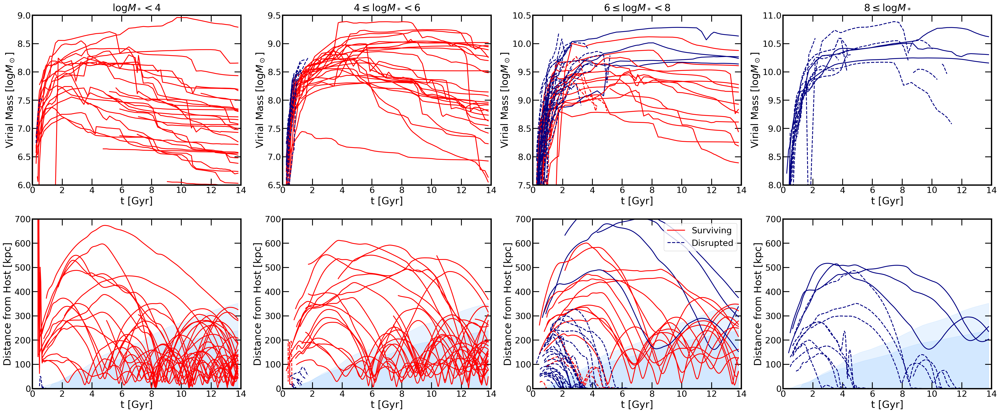

In [11]:
from tangos_halo_module.new import unique_tracks
np.seterr(divide='ignore', invalid='ignore')


fig, ((ax0, ax1, ax2, ax3), (ax8, ax4, ax5, ax6)) = plt.subplots(2, 4, sharex='none', sharey='none', figsize=(40, 16))
fig.set_facecolor('w')
fig.set_dpi(150)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
plt.setp(ax3.spines.values(), linewidth=3)
plt.setp(ax4.spines.values(), linewidth=3)
plt.setp(ax5.spines.values(), linewidth=3)
plt.setp(ax6.spines.values(), linewidth=3)

plt.setp(ax0.spines.values(), linewidth=3)
plt.setp(ax8.spines.values(), linewidth=3)

data = pd.read_csv('Mint_Data/Data100.csv')
status = data['Status'].to_numpy()
ids = data['ID'].to_numpy()
infall_Mstar = data['infall_mass'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_disrupt = data['time_disruption'].to_numpy()
t_quench = data['time_quench'].to_numpy()

for sim in ['h148', 'h329']:
    #Mint 100 ptcls
    path = get_file_path(tangos_halo=0, simulation=sim, status='Host', halo_id='1', snap_num='4096', 
                         resolution='Mint')
    with h5py.File(path, 'r') as fh:
        t_Gyr = fh['time_|_Gyr'][:]
        hostRvir = fh['Rvir_|_kpc'][:]
    ax4.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
    ax5.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
    ax6.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
    ax8.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)

# -------------------------- Mint -------------------------

count=0    
for idx in ids[(status=='Survivor')]:
    if t_quench[ids==idx]<0:
        color='navy'
    else:
        color='red'
    t, M = unique_tracks(ID=idx, key='Mvir_|_Msol', resolution='Mint')
    t=np.array(t)
    M=np.array(M)
    
    if np.log10(infall_Mstar[ids==idx])<4:
        ax0.plot(t, np.log10(M), lw=2, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot(t, np.log10(M), lw=2, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if count==0:
            ax2.plot(t, np.log10(M), lw=2, alpha=1, c=color)
            count+=1
        else:
            ax2.plot(t, np.log10(M), lw=2, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot(t, np.log10(M), lw=2, alpha=1, c=color)

count=0
for idx in ids[(status=='Zombie')]:
    if t_quench[ids==idx]<0:
        color='navy'
    else:
        color='red'
    t, M = unique_tracks(ID=idx, key='Mvir_|_Msol', resolution='Mint')
    t=np.array(t)
    M=np.array(M)
    
    if np.log10(infall_Mstar[ids==idx])<4:
        ax0.plot(t, np.log10(M), lw=2, alpha=1, c=color, ls='--')
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot(t, np.log10(M), lw=2, alpha=1, c=color, ls='--')
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if count==0:
            ax2.plot(t, np.log10(M), lw=2, alpha=1, c=color, ls='--')
            count+=1
        else:
            ax2.plot(t, np.log10(M), lw=2, alpha=1, c=color, ls='--')
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot(t, np.log10(M), lw=2, alpha=1, c=color, ls='--')
        
        
# -------------------------- Mint Radial Distance -------------------------

count=0    
for idx in ids[(status=='Survivor')]:
    if t_quench[ids==idx]<0:
        color='navy'
    else:
        color='red'
    k, (t, x, y, z, R) = orbit_interpolation(ID=idx, resolution='Mint')
    t=np.array(t)
    x=np.array(x)
    y=np.array(y)
    z=np.array(z)   
    R = (x**2 + y**2 + z**2)**(1/2)
    
    if np.log10(infall_Mstar[ids==idx])<4:
        ax8.plot(t, R, lw=2, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax4.plot(t, R, lw=2, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if count==0:
            ax5.plot(t, R, lw=2, alpha=1, c=color, label='Surviving')
            count+=1
        else:
            ax5.plot(t, R, lw=2, alpha=1, c=color)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax6.plot(t, R, lw=2, alpha=1, c=color)

count=0
for idx in ids[(status=='Zombie')]:
    if t_quench[ids==idx]<0:
        color='navy'
    else:
        color='red'
    k, (t, x, y, z, R) = orbit_interpolation(ID=idx, resolution='Mint')
    t=np.array(t)
    x=np.array(x)
    y=np.array(y)
    z=np.array(z)
    R = (x**2 + y**2 + z**2)**(1/2)
    
    if np.log10(infall_Mstar[ids==idx])<4:
        ax8.plot(t, R, lw=2, alpha=1, c=color, ls='--')
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax4.plot(t[R<200], R[R<200], lw=2, alpha=1, c=color, ls='--')
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if count==0:
            ax5.plot(t, R, lw=2, alpha=1, c=color, ls='--', label='Disrupted')
            count+=1
        else:
            ax5.plot(t, R, lw=2, alpha=1, c=color, ls='--')
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax6.plot(t, R, lw=2, alpha=1, c=color, ls='--')
# ----------------------------------------------------------------------------------

ax0.set_xlim(0, 14)
ax0.set_ylim(6, 9)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax0.tick_params(which='major', length=15, width=2, labelsize=15)
ax0.tick_params(which='minor', length=8, width=2, labelsize=15)
ax0.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax0.set_title('$\log M_* < 4$', fontsize=23, pad=10)
ax0.set_xlabel('t [Gyr]', fontsize=23)
ax0.set_ylabel('Virial Mass [$\log M_\odot$]', fontsize=23)

ax1.set_xlim(0, 14)
ax1.set_ylim(6.5, 9.5)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('$4 \leq \log M_* < 6$', fontsize=23, pad=10)
ax1.set_xlabel('t [Gyr]', fontsize=23)
ax1.set_ylabel('Virial Mass [$\log M_\odot$]', fontsize=23)

ax2.set_xlim(0, 14)
ax2.set_ylim(7.5, 10.5)
# ax1.set_xscale('log')
# ax2.legend(loc='upper right', fontsize=20, frameon=True)
ax2.tick_params(which='major', length=15, width=2, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('$6 \leq \log M_* < 8$', fontsize=23, pad=10)
ax2.set_xlabel('t [Gyr]', fontsize=23)
ax2.set_ylabel('Virial Mass [$\log M_\odot$]', fontsize=23)

ax3.set_xlim(0, 14)
ax3.set_ylim(8, 11)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax3.tick_params(which='major', length=15, width=2, labelsize=15)
ax3.tick_params(which='minor', length=8, width=2, labelsize=15)
ax3.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax3.set_title('$8 \leq \log M_*$', fontsize=23, pad=10)
ax3.set_xlabel('t [Gyr]', fontsize=23)
ax3.set_ylabel('Virial Mass [$\log M_\odot$]', fontsize=23)

ax4.set_xlim(0, 14)
ax4.set_ylim(-1, 700)
ax4.tick_params(which='major', length=15, width=2, labelsize=15)
ax4.tick_params(which='minor', length=8, width=2, labelsize=15)
ax4.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel('t [Gyr]', fontsize=23)
ax4.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax5.set_xlim(0, 14)
ax5.set_ylim(-1, 700)
ax5.legend(loc='upper right', fontsize=20, frameon=True)
ax5.tick_params(which='major', length=15, width=2, labelsize=15)
ax5.tick_params(which='minor', length=8, width=2, labelsize=15)
ax5.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax5.set_xlabel('t [Gyr]', fontsize=23)
ax5.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax6.set_xlim(0, 14)
ax6.set_ylim(-1, 700)
ax6.tick_params(which='major', length=15, width=2, labelsize=15)
ax6.tick_params(which='minor', length=8, width=2, labelsize=15)
ax6.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax6.set_xlabel('t [Gyr]', fontsize=23)
ax6.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax8.set_xlim(0, 14)
ax8.set_ylim(-1, 700)
ax8.tick_params(which='major', length=15, width=2, labelsize=15)
ax8.tick_params(which='minor', length=8, width=2, labelsize=15)
ax8.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax8.set_xlabel('t [Gyr]', fontsize=23)
ax8.set_ylabel('Distance from Host [kpc]', fontsize=23)

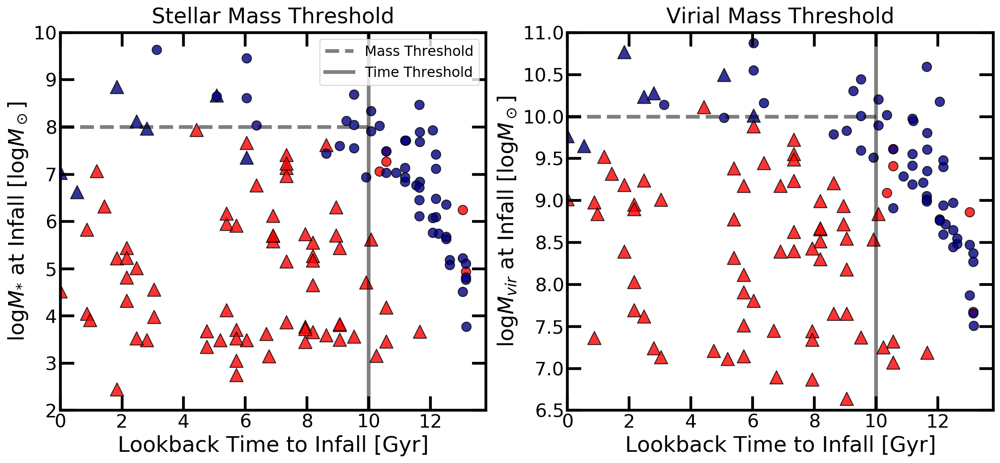

In [98]:
fig, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(15, 7))
# (ax1, ax2) = ax
fig.set_facecolor('w')
# fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 10, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
fig.set_dpi(150)
x = lookback_t_infall
y = M_infall

data = pd.read_csv('Mint_Data/Data100.csv')
myIDs = data['ID'].to_numpy()

status = data['Status'].to_numpy()
simulation = data['Simulation'].to_numpy()
M_infall = np.log10(data['infall_mass'].to_numpy())
t_quench = data['time_quench'].to_numpy()
t_infall = data['time_infall'].to_numpy()
M_ratio_infall = data['infall_mass_ratio'].to_numpy()
lookback_t_infall = 13.8 - t_infall

x = lookback_t_infall
y = M_infall

ax1.fill_between(linx, [1e-2]*len(linx), [1e-4]*len(linx), alpha=0.3, color='lightgreen')
# the scatter plot:
ax1.scatter(x[(status=='Survivor')&(t_quench>=0)], y[(status=='Survivor')&(t_quench>=0)], s=200, 
                   color='red', marker='^', edgecolors="black", linewidth=1, alpha=0.8)
ax1.scatter(x[(status=='Survivor')&(t_quench<0)], y[(status=='Survivor')&(t_quench<0)], s=200,  
                   color='navy', marker='^', edgecolors="black", linewidth=1, alpha=0.8)
ax1.scatter(x[(status=='Zombie')&(t_quench>=0)], y[(status=='Zombie')&(t_quench>=0)], s=100, 
                   color='red', edgecolors='black', facecolors='red', linewidth=1, alpha=0.8)
ax1.scatter(x[(status=='Zombie')&(t_quench<0)], y[(status=='Zombie')&(t_quench<0)], s=100, 
                   color='navy', edgecolors='black', facecolors='navy', linewidth=1, alpha=0.8)
# ax2.text(9, 1.5e-6, 'Quenched', horizontalalignment='left', verticalalignment='center',
#          fontsize=20, color='red')
# ax2.text(7, 6.5, '[Near-Mint Disruption]', horizontalalignment='left', verticalalignment='center',
#          fontsize=18, color='black')
ax1.set_xlim(0, 13.8)
ax1.set_ylim(2, 10)
# ax1.set_yscale('log')
ax1.axhline(8, xmin=0, xmax=10/13.8, lw=4, c='k', alpha=0.5, ls='--', label='Mass Threshold')
ax1.axvline(10, lw=4, c='k', alpha=0.5, ls='-', label='Time Threshold')
ax1.legend(loc='upper right', fontsize=15, frameon=True, framealpha=0.8)
ax1.tick_params(which='major', length=15, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Stellar Mass Threshold', fontsize=23, pad=10)
ax1.set_xlabel('Lookback Time to Infall [Gyr]', fontsize=23)
ax1.set_ylabel('$\log M_{*}$ at Infall [$\log M_\odot$]', fontsize=23)


#----------------------------------------------------------------------------------------------

data = pd.read_csv('Mint_Data/Data100.csv')
myIDs = data['ID'].to_numpy()

status = data['Status'].to_numpy()
simulation = data['Simulation'].to_numpy()
M_infall = np.log10(data['infall_virial_mass'].to_numpy())
t_quench = data['time_quench'].to_numpy()
t_infall = data['time_infall'].to_numpy()
M_ratio_infall = data['infall_mass_ratio'].to_numpy()
lookback_t_infall = 13.8 - t_infall

x = lookback_t_infall
y = M_infall

ax2.fill_between(linx, [1e-2]*len(linx), [1e-4]*len(linx), alpha=0.3, color='lightgreen')
# the scatter plot:
ax2.scatter(x[(status=='Survivor')&(t_quench>=0)], y[(status=='Survivor')&(t_quench>=0)], s=200, 
                   color='red', marker='^', edgecolors="black", linewidth=1, alpha=0.8)
ax2.scatter(x[(status=='Survivor')&(t_quench<0)], y[(status=='Survivor')&(t_quench<0)], s=200,  
                   color='navy', marker='^', edgecolors="black", linewidth=1, alpha=0.8)
ax2.scatter(x[(status=='Zombie')&(t_quench>=0)], y[(status=='Zombie')&(t_quench>=0)], s=100, 
                   color='red', edgecolors='black', facecolors='red', linewidth=1, alpha=0.8)
ax2.scatter(x[(status=='Zombie')&(t_quench<0)], y[(status=='Zombie')&(t_quench<0)], s=100, 
                   color='navy', edgecolors='black', facecolors='navy', linewidth=1, alpha=0.8)
# ax2.text(9, 1.5e-6, 'Quenched', horizontalalignment='left', verticalalignment='center',
#          fontsize=20, color='red')
# ax2.text(7, 6.5, '[Near-Mint Disruption]', horizontalalignment='left', verticalalignment='center',
#          fontsize=18, color='black')
ax2.set_xlim(0, 13.8)
ax2.set_ylim(6.5, 11)
# ax1.set_yscale('log')
ax2.axhline(10, xmin=0, xmax=10/13.8, lw=4, c='k', alpha=0.5, ls='--', label='Mass Threshold')
ax2.axvline(10, lw=4, c='k', alpha=0.5, ls='-', label='Time Threshold')
# ax2.legend(loc='upper right', fontsize=15, frameon=True, framealpha=0.8)
ax2.tick_params(which='major', length=15, width=3, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('Virial Mass Threshold', fontsize=23, pad=10)
ax2.set_xlabel('Lookback Time to Infall [Gyr]', fontsize=23)
ax2.set_ylabel('$\log M_{vir}$ at Infall [$\log M_\odot$]', fontsize=23)

fig.tight_layout()

# Radial Mass Percentiles

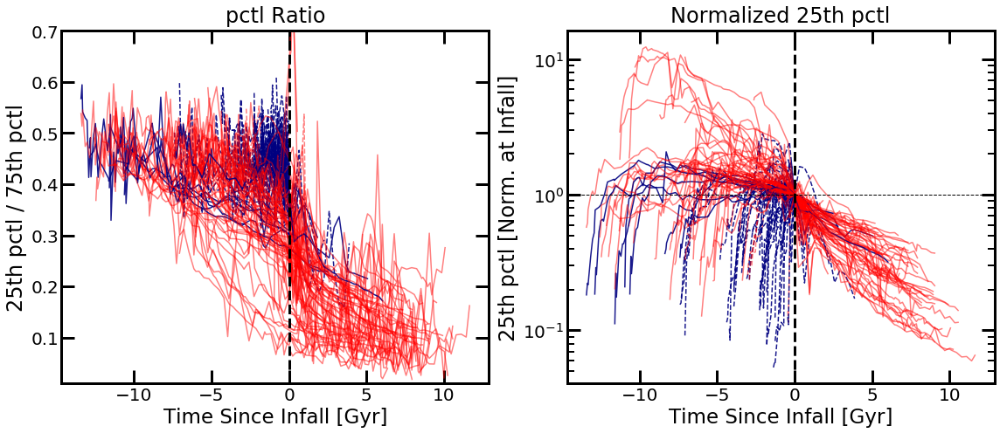

In [19]:
from tangos_halo_module.new import get_mass_profiles

data=pd.read_csv('Data100.csv')
ids=data['ID'].to_numpy()
status=data['Status'].to_numpy()
t_infall=data['time_infall'].to_numpy()
t_quench = data['time_quench'].to_numpy()
Mstar_infall = data['infall_mass'].to_numpy()
log_Mstar_infall = np.log10(Mstar_infall)
 
fig, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(16, 7))
# (ax1, ax2) = ax
fig.set_facecolor('w')
# fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
# fig.set_dpi(150)
data=pd.read_csv('Mint_Data/Data100.csv')
ids=data['ID'].to_numpy()
status=data['Status'].to_numpy()
t_infall=data['time_infall'].to_numpy()
t_quench = data['time_quench'].to_numpy()
Mstar_infall = data['infall_mass'].to_numpy()
log_Mstar_infall = np.log10(Mstar_infall)

for idx in ids[status=='Zombie']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/profile[:,3]
    if t_qn>0:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='r', ls='--', alpha=0.5)
    else:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='navy', ls='--', alpha=0.9)
for idx in ids[status=='Survivor']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/profile[:,3]
    if t_qn>0:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='r', ls='-', alpha=0.5)
    else:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='navy', ls='-', alpha=0.9)
    
ax1.axhline(1, ls='--', lw=1, c='k')
ax1.axvline(0, ls='--', lw=3, c='k')
# ax1.set_xlim(0, 14)
ax1.set_ylim(1e-2, 0.7)
# ax1.set_yscale('log')
# ax1.legend(loc='lower right', fontsize=20, frameon=True, framealpha=0.4)
ax1.tick_params(which='major', length=15, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('pctl Ratio', fontsize=24, pad=10)
ax1.set_xlabel('Time Since Infall [Gyr]', fontsize=23)
ax1.set_ylabel('25th pctl / 75th pctl', fontsize=24)


data=pd.read_csv('Mint_Data/Data100.csv')
ids=data['ID'].to_numpy()
status=data['Status'].to_numpy()
t_infall=data['time_infall'].to_numpy()
t_quench = data['time_quench'].to_numpy()
Mstar_infall = data['infall_mass'].to_numpy()
log_Mstar_infall = np.log10(Mstar_infall)

for idx in ids[status=='Zombie']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/(profile_in)#*50000#/(profile_in)#profile[:,1]/profile[:,3]
    if t_qn>0:
        ax2.plot(t[ratio>0]-t_in, ratio[ratio>0], c='r', ls='--', alpha=0.5)
    else:
        ax2.plot(t[ratio>0]-t_in, ratio[ratio>0], c='navy', ls='--', alpha=0.9)
for idx in ids[status=='Survivor']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/(profile_in)#*50000#/(profile_in)#profile[:,1]/profile[:,3]
    if t_qn>0:
        if ratio[ratio>0][-1]<2e-2:
            pass
        else:
            ax2.plot(t[ratio>0]-t_in, ratio[ratio>0], c='r', ls='-', alpha=0.5)
    else:
        ax2.plot(t[ratio>0]-t_in, ratio[ratio>0], c='navy', ls='-', alpha=0.9)
    
ax2.axhline(1, ls='--', lw=1, c='k')
ax2.axvline(0, ls='--', lw=3, c='k')
# ax1.set_xlim(0, 14)
# ax2.set_ylim(0.1, 100)
ax2.set_yscale('log')
# ax1.legend(loc='lower right', fontsize=20, frameon=True, framealpha=0.4)
ax2.tick_params(which='major', length=15, width=3, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('Normalized 25th pctl', fontsize=24, pad=10)
ax2.set_xlabel('Time Since Infall [Gyr]', fontsize=23)
ax2.set_ylabel('25th pctl [Norm. at Infall]', fontsize=24)

fig.tight_layout()

# 3D Orbits

In [20]:
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

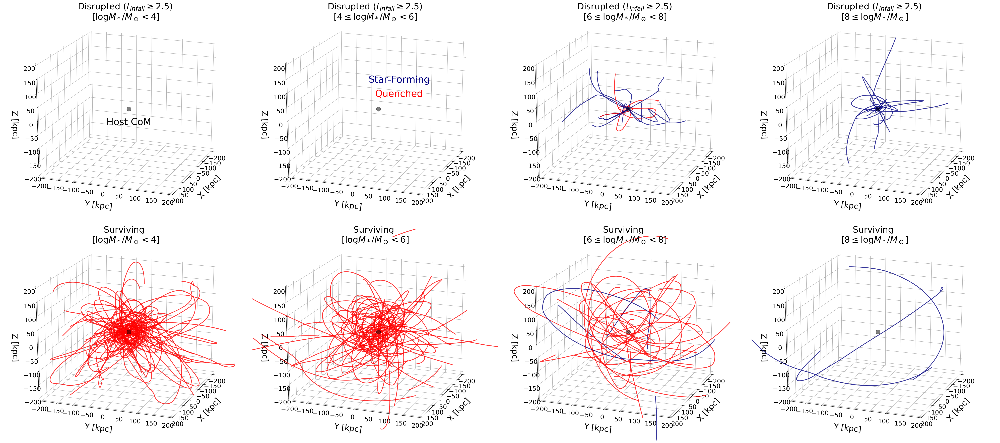

In [40]:
# %matplotlib notebook
data = pd.read_csv('Mint_Data/Data100.csv')
ids = data['ID'].to_numpy()
infall_Mstar = data['infall_mass'].to_numpy()
plt.rcParams.update({'figure.max_open_warning': 0})
t_infall = data['time_infall'].to_numpy()
t_quench = data['time_quench'].to_numpy()
status = data['Status'].to_numpy()
sim = data['Simulation'].to_numpy()
# plt.figure(figsize=, facecolor='w')
# fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(23, 15))
fig = plt.figure(figsize=(40, 18))
fig.set_dpi(150)
fig.set_facecolor('w')
# plt.setp(ax1.spines.values(), linewidth=3)
# plt.setp(ax2.spines.values(), linewidth=3)
# plt.setp(ax3.spines.values(), linewidth=3)

# plt.setp(ax4.spines.values(), linewidth=3)
# plt.setp(ax5.spines.values(), linewidth=3)
# plt.setp(ax6.spines.values(), linewidth=3)
ax0 = fig.add_subplot(241, projection='3d')
ax1 = fig.add_subplot(242, projection='3d')
ax2 = fig.add_subplot(243, projection='3d')
ax3 = fig.add_subplot(244, projection='3d')

ax8 = fig.add_subplot(245, projection='3d')
ax4 = fig.add_subplot(246, projection='3d')
ax5 = fig.add_subplot(247, projection='3d')
ax6 = fig.add_subplot(248, projection='3d')
# ax = plt.axes(projection='3d')

# colors = ['red', 'blue', 'black', 'orange', 'green', 'dodgerblue']
for idx in ids[(status=='Zombie') & (t_infall>=2.5)]:
    t_in=t_infall[ids==idx]
    t_q=t_quench[ids==idx]
    if t_q>0:
        color='red'
    else:
        color='navy'
    s=sim[ids==idx]
    raw, (t, x, y, z, Rvir) = orbit_interpolation(ID=idx, resolution='Mint')
    # Data for a three-dimensional line
    if np.log10(infall_Mstar[ids==idx])<4:
        ax0.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c=color, alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c=color, alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        ax2.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c=color, alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c=color, alpha=0.8, lw=2)
        
for idx in ids[(status=='Survivor')]:
    t_in=t_infall[ids==idx]
    t_q=t_quench[ids==idx]
    if t_q>0:
        color='red'
    else:
        color='navy'
    s=sim[ids==idx]
    raw, (t, x, y, z, Rvir) = orbit_interpolation(ID=idx, resolution='Mint')
    # Data for a three-dimensional line
    if np.log10(infall_Mstar[ids==idx])<4:
        ax8.plot3D(np.array(x)[t>=t_in-1], np.array(y)[t>=t_in-1], np.array(z)[t>=t_in-1], c=color, alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        ax4.plot3D(np.array(x)[t>=t_in-1], np.array(y)[t>=t_in-1], np.array(z)[t>=t_in-1], c=color, alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        ax5.plot3D(np.array(x)[t>=t_in-1], np.array(y)[t>=t_in-1], np.array(z)[t>=t_in-1], c=color, alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax6.plot3D(np.array(x)[t>=t_in-1], np.array(y)[t>=t_in-1], np.array(z)[t>=t_in-1], c=color, alpha=0.8, lw=2)

ax0.text(0, 0, -50, 'Host CoM', horizontalalignment='center', verticalalignment='center',
         fontsize=27, color='black')
ax0.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax0.set_title('Disrupted ($t_{infall} \geq 2.5$) \n[$\log M_*/M_\odot < 4$]', fontsize=25, pad=10)
ax0.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax0.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax0.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax0.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax0.set_xlim(-200, 200)
ax0.set_ylim(-200, 200)
ax0.set_zlim(-200, 200)
ax0.tick_params(which='both', length=10, labelsize=18)
ax0.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax0.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax0.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax2.set_xticks([])
ax0.azim=20
ax0.elev=20

ax1.text(100, 100, 100, 'Quenched', horizontalalignment='center', verticalalignment='center',
         fontsize=27, color='red')
# ax1.text(100, 100, 150, 'h229', horizontalalignment='center', verticalalignment='center',
#          fontsize=27, color='blue')
# ax1.text(100, 100, 100, 'h242', horizontalalignment='center', verticalalignment='center',
#          fontsize=27, color='green')
ax1.text(100, 100, 150, 'Star-Forming', horizontalalignment='center', verticalalignment='center',
         fontsize=27, color='navy')
ax1.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Disrupted ($t_{infall} \geq 2.5$) \n[$4 \leq \log M_*/M_\odot < 6$]', fontsize=25, pad=10)
ax1.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax1.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax1.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax1.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax1.set_xlim(-200, 200)
ax1.set_ylim(-200, 200)
ax1.set_zlim(-200, 200)
ax1.tick_params(which='both', length=10, labelsize=18)
ax1.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax1.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax1.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax1.set_xticks([])
ax1.azim=20
ax1.elev=20

ax2.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('Disrupted ($t_{infall} \geq 2.5$) \n[$6 \leq \log M_*/M_\odot < 8$]', fontsize=25, pad=10)
ax2.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax2.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax2.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax2.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax2.set_xlim(-200, 200)
ax2.set_ylim(-200, 200)
ax2.set_zlim(-200, 200)
ax2.tick_params(which='both', length=10, labelsize=18)
ax2.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax2.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax2.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax2.set_xticks([])
ax2.azim=20
ax2.elev=20

ax3.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax3.set_title('Disrupted ($t_{infall} \geq 2.5$) \n[$8 \leq \log M_*/M_\odot$]', fontsize=25, pad=10)
ax3.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax3.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax3.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax3.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax3.set_xlim(-200, 200)
ax3.set_ylim(-200, 200)
ax3.set_zlim(-200, 200)
ax3.tick_params(which='both', length=10, labelsize=18)
ax3.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax3.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax3.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax3.set_xticks([])
ax3.azim=20
ax3.elev=20

ax8.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax8.set_title('Surviving \n[$\log M_*/M_\odot < 4$]', fontsize=25, pad=10)
ax8.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax8.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax8.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax8.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax8.set_xlim(-200, 200)
ax8.set_ylim(-200, 200)
ax8.set_zlim(-200, 200)
ax8.tick_params(which='both', length=10, labelsize=18)
ax8.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax8.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax8.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax6.set_xticks([])
ax8.azim=20
ax8.elev=20

ax4.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax4.set_title('Surviving \n[$\log M_*/M_\odot < 6$]', fontsize=25, pad=10)
ax4.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax4.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax4.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax4.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax4.set_xlim(-200, 200)
ax4.set_ylim(-200, 200)
ax4.set_zlim(-200, 200)
ax4.tick_params(which='both', length=10, labelsize=18)
ax4.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax4.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax4.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax4.set_xticks([])
ax4.azim=20
ax4.elev=20

ax5.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax5.set_title('Surviving \n[$6 \leq \log M_*/M_\odot < 8$]', fontsize=25, pad=10)
ax5.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax5.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax5.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax5.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax5.set_xlim(-200, 200)
ax5.set_ylim(-200, 200)
ax5.set_zlim(-200, 200)
ax5.tick_params(which='both', length=10, labelsize=18)
ax5.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax5.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax5.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax5.set_xticks([])
ax5.azim=20
ax5.elev=20

ax6.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax6.set_title('Surviving \n[$8 \leq \log M_*/M_\odot$]', fontsize=25, pad=10)
ax6.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax6.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax6.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax6.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax6.set_xlim(-200, 200)
ax6.set_ylim(-200, 200)
ax6.set_zlim(-200, 200)
ax6.tick_params(which='both', length=10, labelsize=18)
ax6.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax6.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax6.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax6.set_xticks([])
ax6.azim=20
ax6.elev=20

fig.tight_layout()
# fig.subplots_adjust(wspace=0, hspace=0)
# fig.tight_layout()

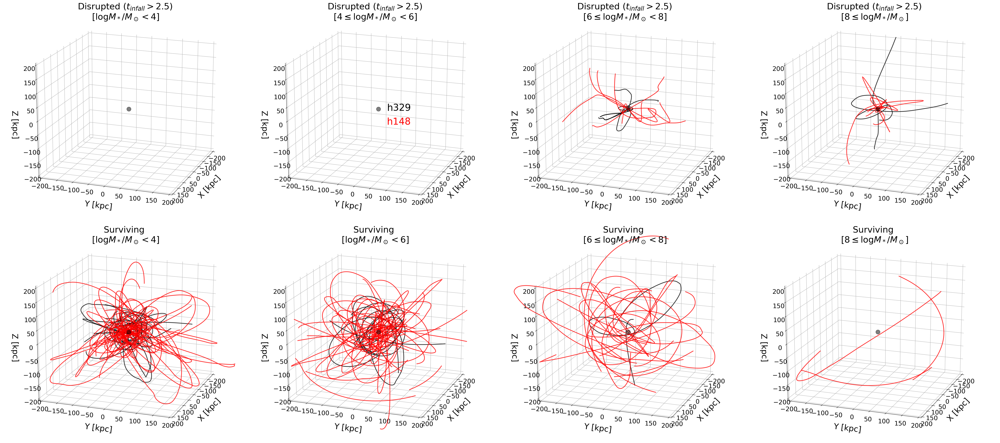

In [30]:
# %matplotlib notebook
data = pd.read_csv('Mint_Data/Data100.csv')
ids = data['ID'].to_numpy()
infall_Mstar = data['infall_mass'].to_numpy()
plt.rcParams.update({'figure.max_open_warning': 0})
t_infall = data['time_infall'].to_numpy()
status = data['Status'].to_numpy()
sim = data['Simulation'].to_numpy()
# plt.figure(figsize=, facecolor='w')
# fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(23, 15))
fig = plt.figure(figsize=(40, 18))
fig.set_dpi(150)
fig.set_facecolor('w')
# plt.setp(ax1.spines.values(), linewidth=3)
# plt.setp(ax2.spines.values(), linewidth=3)
# plt.setp(ax3.spines.values(), linewidth=3)

# plt.setp(ax4.spines.values(), linewidth=3)
# plt.setp(ax5.spines.values(), linewidth=3)
# plt.setp(ax6.spines.values(), linewidth=3)
ax0 = fig.add_subplot(241, projection='3d')
ax1 = fig.add_subplot(242, projection='3d')
ax2 = fig.add_subplot(243, projection='3d')
ax3 = fig.add_subplot(244, projection='3d')

ax8 = fig.add_subplot(245, projection='3d')
ax4 = fig.add_subplot(246, projection='3d')
ax5 = fig.add_subplot(247, projection='3d')
ax6 = fig.add_subplot(248, projection='3d')
# ax = plt.axes(projection='3d')

# colors = ['red', 'blue', 'black', 'orange', 'green', 'dodgerblue']
for idx in ids[(status=='Zombie') & (t_infall>=2.5)]:
    t_in=t_infall[ids==idx]
    s=sim[ids==idx]
    raw, (t, x, y, z, Rvir) = orbit_interpolation(ID=idx, resolution='Mint')
    # Data for a three-dimensional line
    if np.log10(infall_Mstar[ids==idx])<4:
        if s=='h148':
            ax0.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax0.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax0.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax0.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='black', alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        if s=='h148':
            ax1.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax1.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax1.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax1.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='black', alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if s=='h148':
            ax2.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax2.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax2.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax2.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='black', alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        if s=='h148':
            ax3.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax3.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax3.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax3.plot3D(x[t>=t_in-1], y[t>=t_in-1], z[t>=t_in-1], c='black', alpha=0.8, lw=2)
        
for idx in ids[(status=='Survivor')]:
    t_in=t_infall[ids==idx]
    s=sim[ids==idx]
    raw, (t, x, y, z, Rvir) = orbit_interpolation(ID=idx, resolution='Mint')
    # Data for a three-dimensional line
    if np.log10(infall_Mstar[ids==idx])<4:
        if s=='h148':
            ax8.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax8.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax8.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax8.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='black', alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=4 and np.log10(infall_Mstar[ids==idx])<6:
        if s=='h148':
            ax4.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax4.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax4.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax4.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='black', alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if s=='h148':
            ax5.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax5.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax5.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax5.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='black', alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        if s=='h148':
            ax6.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax6.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax6.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax6.plot3D(np.array(x)[t>=t_in], np.array(y)[t>=t_in], np.array(z)[t>=t_in], c='black', alpha=0.8, lw=2)


ax0.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax0.set_title('Disrupted ($t_{infall} > 2.5$) \n[$\log M_*/M_\odot < 4$]', fontsize=25, pad=10)
ax0.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax0.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax0.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax0.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax0.set_xlim(-200, 200)
ax0.set_ylim(-200, 200)
ax0.set_zlim(-200, 200)
ax0.tick_params(which='both', length=10, labelsize=18)
ax0.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax0.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax0.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax2.set_xticks([])
ax0.azim=20
ax0.elev=20

ax1.text(100, 100, 0, 'h148', horizontalalignment='center', verticalalignment='center',
         fontsize=27, color='red')
# ax1.text(100, 100, 150, 'h229', horizontalalignment='center', verticalalignment='center',
#          fontsize=27, color='blue')
# ax1.text(100, 100, 100, 'h242', horizontalalignment='center', verticalalignment='center',
#          fontsize=27, color='green')
ax1.text(100, 100, 50, 'h329', horizontalalignment='center', verticalalignment='center',
         fontsize=27, color='black')
ax1.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Disrupted ($t_{infall} > 2.5$) \n[$4 \leq \log M_*/M_\odot < 6$]', fontsize=25, pad=10)
ax1.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax1.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax1.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax1.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax1.set_xlim(-200, 200)
ax1.set_ylim(-200, 200)
ax1.set_zlim(-200, 200)
ax1.tick_params(which='both', length=10, labelsize=18)
ax1.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax1.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax1.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax1.set_xticks([])
ax1.azim=20
ax1.elev=20

ax2.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('Disrupted ($t_{infall} > 2.5$) \n[$6 \leq \log M_*/M_\odot < 8$]', fontsize=25, pad=10)
ax2.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax2.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax2.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax2.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax2.set_xlim(-200, 200)
ax2.set_ylim(-200, 200)
ax2.set_zlim(-200, 200)
ax2.tick_params(which='both', length=10, labelsize=18)
ax2.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax2.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax2.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax2.set_xticks([])
ax2.azim=20
ax2.elev=20

ax3.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax3.set_title('Disrupted ($t_{infall} > 2.5$) \n[$8 \leq \log M_*/M_\odot$]', fontsize=25, pad=10)
ax3.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax3.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax3.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax3.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax3.set_xlim(-200, 200)
ax3.set_ylim(-200, 200)
ax3.set_zlim(-200, 200)
ax3.tick_params(which='both', length=10, labelsize=18)
ax3.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax3.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax3.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax3.set_xticks([])
ax3.azim=20
ax3.elev=20

ax8.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax8.set_title('Surviving \n[$\log M_*/M_\odot < 4$]', fontsize=25, pad=10)
ax8.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax8.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax8.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax8.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax8.set_xlim(-200, 200)
ax8.set_ylim(-200, 200)
ax8.set_zlim(-200, 200)
ax8.tick_params(which='both', length=10, labelsize=18)
ax8.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax8.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax8.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax6.set_xticks([])
ax8.azim=20
ax8.elev=20

ax4.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax4.set_title('Surviving \n[$\log M_*/M_\odot < 6$]', fontsize=25, pad=10)
ax4.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax4.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax4.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax4.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax4.set_xlim(-200, 200)
ax4.set_ylim(-200, 200)
ax4.set_zlim(-200, 200)
ax4.tick_params(which='both', length=10, labelsize=18)
ax4.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax4.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax4.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax4.set_xticks([])
ax4.azim=20
ax4.elev=20

ax5.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax5.set_title('Surviving \n[$6 \leq \log M_*/M_\odot < 8$]', fontsize=25, pad=10)
ax5.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax5.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax5.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax5.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax5.set_xlim(-200, 200)
ax5.set_ylim(-200, 200)
ax5.set_zlim(-200, 200)
ax5.tick_params(which='both', length=10, labelsize=18)
ax5.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax5.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax5.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax5.set_xticks([])
ax5.azim=20
ax5.elev=20

ax6.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
ax6.set_title('Surviving \n[$8 \leq \log M_*/M_\odot$]', fontsize=25, pad=10)
ax6.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax6.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax6.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax6.scatter(0, 0, 0, c='k', marker='.', s=600, alpha=0.5)
ax6.set_xlim(-200, 200)
ax6.set_ylim(-200, 200)
ax6.set_zlim(-200, 200)
ax6.tick_params(which='both', length=10, labelsize=18)
ax6.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax6.set_ylabel('Y [kpc]', fontsize=23, labelpad=20)
ax6.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax6.set_xticks([])
ax6.azim=20
ax6.elev=20

fig.tight_layout()
# fig.subplots_adjust(wspace=0, hspace=0)
# fig.tight_layout()

In [48]:
def max_mass_time(ID=0, simulation=0, status=0, tangos_halo=0, halo_id=0, snap_num=0, category='stars', resolution=1000):
    '''
    input params: 
        simulation: h148, h229, h242, h329: string
        status: 'Zombie', 'Survivor': string
        tangos_halo: 0 or a valid Tangos halo object
        halo_id: halo id: 0 or string or numeric
        snap_num: 0 or 4 digit simulation snapshot number: string
        category: 'stars' or 'dm' or 'total': string
    output params:
        maximum stellar mass: the maximum stellar mass of a dwarf before disruption
            [units: Msol]
        time of maximum stellar mass: the earliest time before disruption when a dwarf reaches its maximum stellar mass
            [units: Gyr since start of simulation]
    '''
    if ID != 0:
        simulation, status, halo_id, snap_num = ID_to_sim_halo_snap(ID=ID)
    #Host
    path = get_file_path(tangos_halo=0, simulation=simulation, status='Host', halo_id='1', snap_num='4096', resolution=resolution)
    with h5py.File(path, 'r') as fh:
        t_Gyr = fh['time_|_Gyr'][:]
        hostMstar = fh['M_star_|_Msol'][:]
        hostMvir = fh['Mvir_|_Msol'][:]
        hostMgas = fh['M_gas_|_Msol'][:]
    #Satellite
    path = get_file_path(tangos_halo=tangos_halo, simulation=simulation, status=status, halo_id=halo_id, snap_num=snap_num, resolution=resolution)
    with h5py.File(path, 'r') as f:
        satMstar = f['M_star_|_Msol'][:]
        satMvir = f['Mvir_|_Msol'][:]
        satMgas = f['M_gas_|_Msol'][:]
    total_mass=satMstar+satMvir+satMgas    
    
    if category=='stars':
        max_satM = max(satMstar[satMstar != hostMstar])
        max_satM_time = min(t_Gyr[satMstar==max_satM])
    elif category=='dm':
        max_satM = max(satMvir[satMvir != hostMvir])
        max_satM_time = min(t_Gyr[satMvir==max_satM])
    elif category=='total':
        max_satM = max(total_mass[satMstar != hostMstar])
        max_satM_time = min(t_Gyr[total_mass==max_satM])
    elif category=='ratio':
        ratio = satMstar/total_mass
        ratio[total_mass==0]=0
        max_satM = max(ratio[satMstar != hostMstar])
        max_satM_time = min(t_Gyr[ratio==max_satM])
    else:
        raise ValueError('A very specific bad thing happened. Try category= "stars" or "dm".') 
    
    return max_satM, max_satM_time

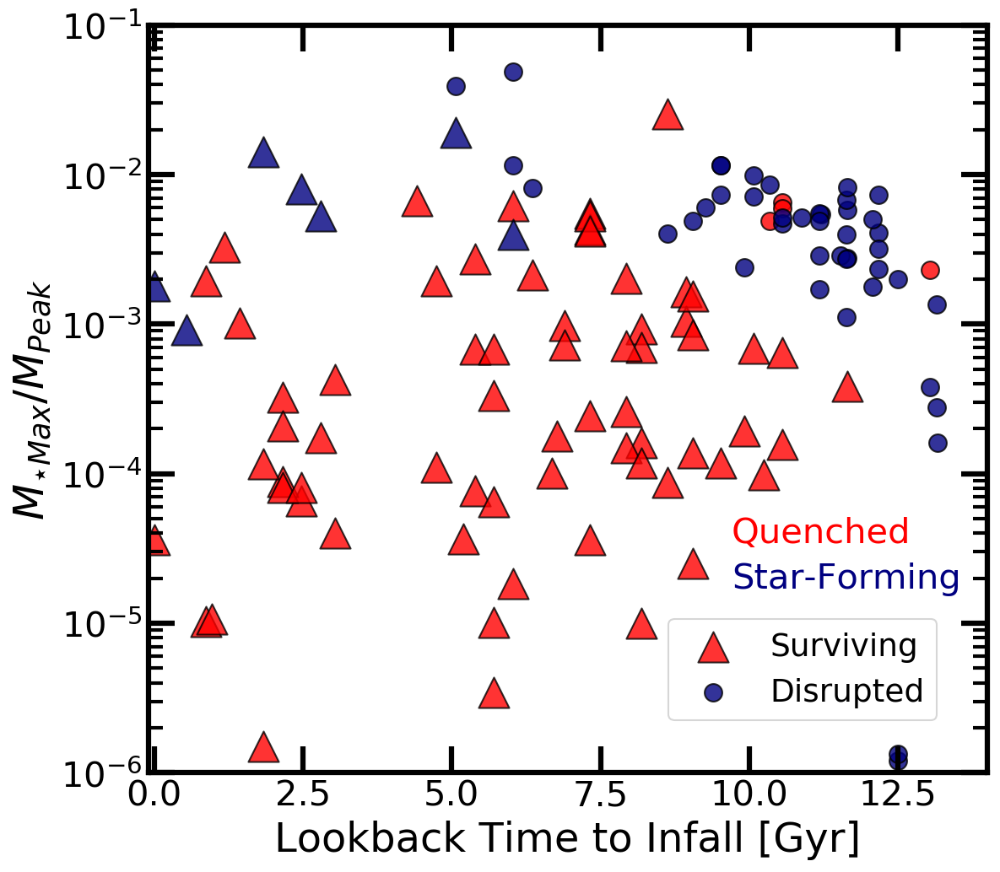

In [99]:
#Ferah's figure
# from tangos_halo_module.halo_properties import max_mass_time
fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(8, 7))
# (ax1, ax2) = ax
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
# plt.setp(ax2.spines.values(), linewidth=3)

Mpeak=np.array([max_mass_time(ID=idx, category='total', resolution='Mint')[0] for idx in ids])
x = lookback_t_infall
y = (max_Mstar/Mpeak)

# the scatter plot:
ax1.scatter(x[(status=='Survivor')&(t_quench>=0)], y[(status=='Survivor')&(t_quench>=0)], s=300, 
                   color='red', marker='^', edgecolors="black", linewidth=1, alpha=0.8, label = 'Surviving')
ax1.scatter(x[(status=='Survivor')&(t_quench<0)], y[(status=='Survivor')&(t_quench<0)], s=300,  
                   color='navy', marker='^', edgecolors="black", linewidth=1, alpha=0.8)
ax1.scatter(x[(status=='Zombie')&(t_quench>=0)], y[(status=='Zombie')&(t_quench>=0)], s=100, 
                   color='red', edgecolors='black', facecolors='red', linewidth=1, alpha=0.8)
ax1.scatter(x[(status=='Zombie')&(t_quench<0)], y[(status=='Zombie')&(t_quench<0)], s=100, 
                   color='navy', edgecolors='black', facecolors='navy', linewidth=1, alpha=0.8, label = 'Disrupted')
ax1.text(9.7, 4e-5, 'Quenched', horizontalalignment='left', verticalalignment='center',
         fontsize=20, color='red')
ax1.text(9.7, 2e-5, 'Star-Forming', horizontalalignment='left', verticalalignment='center',
         fontsize=20, color='navy')
ax1.set_xlim(-0.1, 14)
ax1.set_ylim(1e-6 , 1e-1)
ax1.set_yscale('log')
ax1.legend(loc=(0.62, 0.07), fontsize=18, frameon=True, framealpha=0.8)
ax1.tick_params(which='major', length=15, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
# ax1.set_title('Quenching Times', fontsize=24, pad=10)
ax1.set_xlabel('Lookback Time to Infall [Gyr]', fontsize=23)
ax1.set_ylabel('$M_{\star Max}/M_{Peak}$', fontsize=24)

fig.tight_layout()

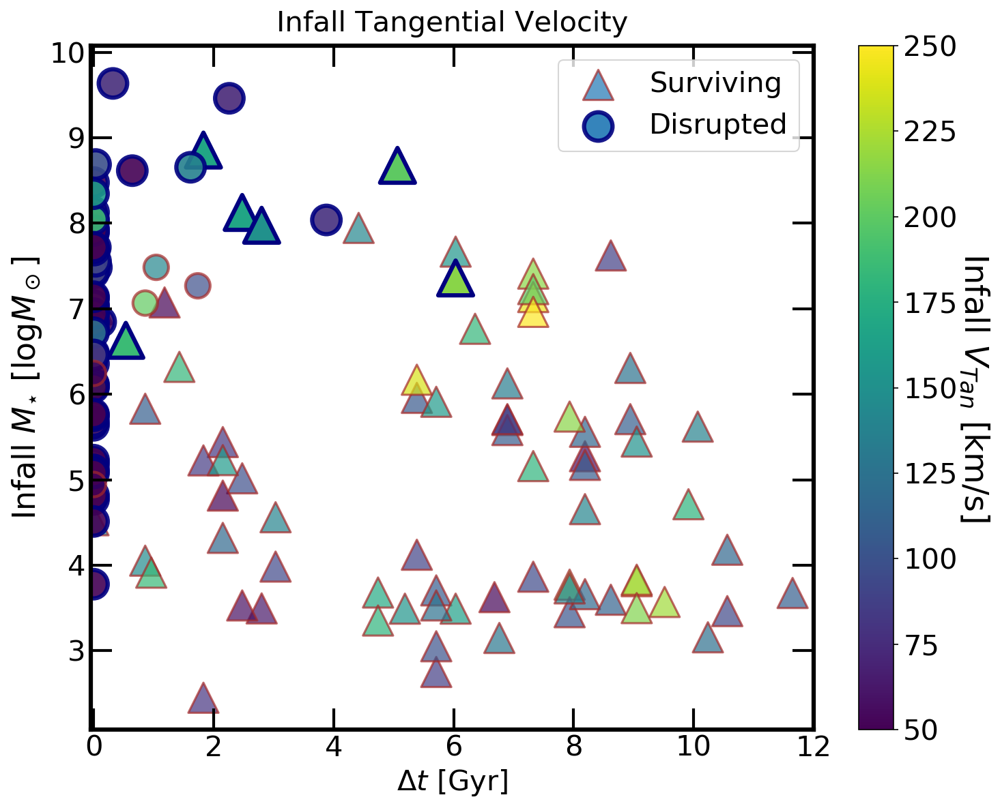

In [97]:
vtan = data['infall_tangential_velocity']
vtot = data['infall_relative_velocity']
M_infall = data['infall_mass'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_final = data['time_disruption'].to_numpy()
status = data['Status'].to_numpy()
t_final[t_final==-1]=13.80 # For survivors
# print(t_final)
Delta_t = t_final - t_infall

fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(10, 8))
fig.set_facecolor('w')
fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
x=Delta_t
y= np.log10(M_infall)#data['infall_mass_ratio'].to_numpy() #np.log10(M_infall)
z=vtan
k=t_infall
# Survivors
im1 = ax1.scatter(x[(status=='Survivor')&(t_quench>0)], y[(status=='Survivor')&(t_quench>0)], 
                  marker='^', edgecolor='brown', c=z[(status=='Survivor')&(t_quench>0)], alpha=0.7, lw=1.5, 
                  s=450, cmap=cm, vmin=50, vmax=250, label='Surviving') 
im1 = ax1.scatter(x[(status=='Survivor')&(t_quench<0)], y[(status=='Survivor')&(t_quench<0)], 
                  marker='^', edgecolor='navy', c=z[(status=='Survivor')&(t_quench<0)], alpha=1, lw=3, 
                  s=600, cmap=cm, vmin=50, vmax=250) 
ax1.scatter(x[(status=='Zombie')&(t_quench<0)], y[(status=='Zombie')&(t_quench<0)], marker='o',
            edgecolor='navy', c=z[(status=='Zombie')&(t_quench<0)], alpha=0.9, lw=3, s=400, 
            cmap=cm, vmin=50, vmax=250, label='Disrupted') 
ax1.scatter(x[(status=='Zombie')&(t_quench>0)], y[(status=='Zombie')&(t_quench>0)], marker='o',
            edgecolor='brown', c=z[(status=='Zombie')&(t_quench>0)], alpha=0.7, lw=2, s=300, 
            cmap=cm, vmin=50, vmax=250) 
# ax1.plot(linx, linx, lw=0.7, c='black', ls='--')

cbar1 = fig.colorbar(im1, ax=ax1)
cbar1.set_label('Infall $V_{Tan}$ [km/s]', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)

ax1.set_xlim(-0.05, 12)
# ax1.set_ylim(1e-8 , 1e0)
# ax1.set_yscale('log')
ax1.legend(loc='upper right', fontsize=20, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Infall Tangential Velocity', fontsize=20, pad=10)
ax1.set_xlabel('$\Delta t$ [Gyr]', fontsize=20)
ax1.set_ylabel('Infall $M_{\star}$ [$\log M_\odot$]', fontsize=22)
fig.tight_layout()